Installing the Packages

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:

%%capture
!pip install super-gradients
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

Importing all the required libraries

In [ ]:
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

The console stream is logged into /root/sg_logs/console.log


[2024-08-29 21:18:27] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-08-29 21:18:37] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-08-29 21:18:39] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2024-08-29 21:18:39] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2024-08-29 21:18:39] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2024-08-29 21:18:39] WARNING - env_sanity_check.py - Failed to verify installed packages: sphinx-rtd-theme required but not found
[2024-08-29 21:18:39] WARNING - env_sanity_check.py - Failed to verify installed packages: torchmetrics required but not found
[2024-08-29 21:18:39] WARNING - env_sanity_check.py - Failed to verify installed packages: hydra-core required but not found
[2024-08-29 21:18:39] WARNI

In [ ]:
from IPython.display import clear_output

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

In [ ]:
from super_gradients.training import models

Setting the checkpoint directory and experiment name | Instantiated the trainer

In [ ]:
CHECKPOINT_DIR = 'checkpoints'
trainer = Trainer(experiment_name='ppe_yolonas_run', ckpt_root_dir=CHECKPOINT_DIR)

Exporting the Dataset from Roboflow into the Google Colab Notebook

In [ ]:

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="OUx13M4wAVBt0qeZboyR")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
dataset = project.version(2).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to PPE_Detection-2 in yolov5pytorch::   6%|▌         | 385/6472 [00:00<00:01, 3848.47it/s]

Extracting Dataset Version Zip to PPE_Detection-2 in yolov5pytorch::  84%|████████▍ | 5433/6472 [00:01<00:00, 6772.72it/s]

Load your dataset parameters into a dictionary

In [ ]:
dataset_params = {
    'data_dir':'/content/PPE_Detection-2',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['Dust Mask', 'Eye Wear', 'Glove', 'Protective Boots', 'Protective Helmet', 'Safety Vest', 'Shield']
}

Extracting Dataset Version Zip to PPE_Detection-2 in yolov5pytorch:: 100%|██████████| 6472/6472 [00:01<00:00, 4707.14it/s]


Pass the values for dataset_params into the dataset_params argument as shown below.

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

clear_output()

Indexing dataset annotations: 100%|██████████| 322/322 [00:00<00:00, 1263.12it/s]


 Inspect the Dataset Defined Earlier

In [ ]:
train_data.dataset.transforms

In [ ]:

train_data.dataset.dataset_params['transforms'][1]

{'DetectionRandomAffine': {'degrees': 10.0, 'translate': 0.1, 'scales': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'filter_box_candidates': True, 'wh_thr': 2, 'area_thr': 0.1, 'ar_thr': 20}}

In [ ]:

train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10.42

Plot a batch of training data with their augmentations applied to see what they look like

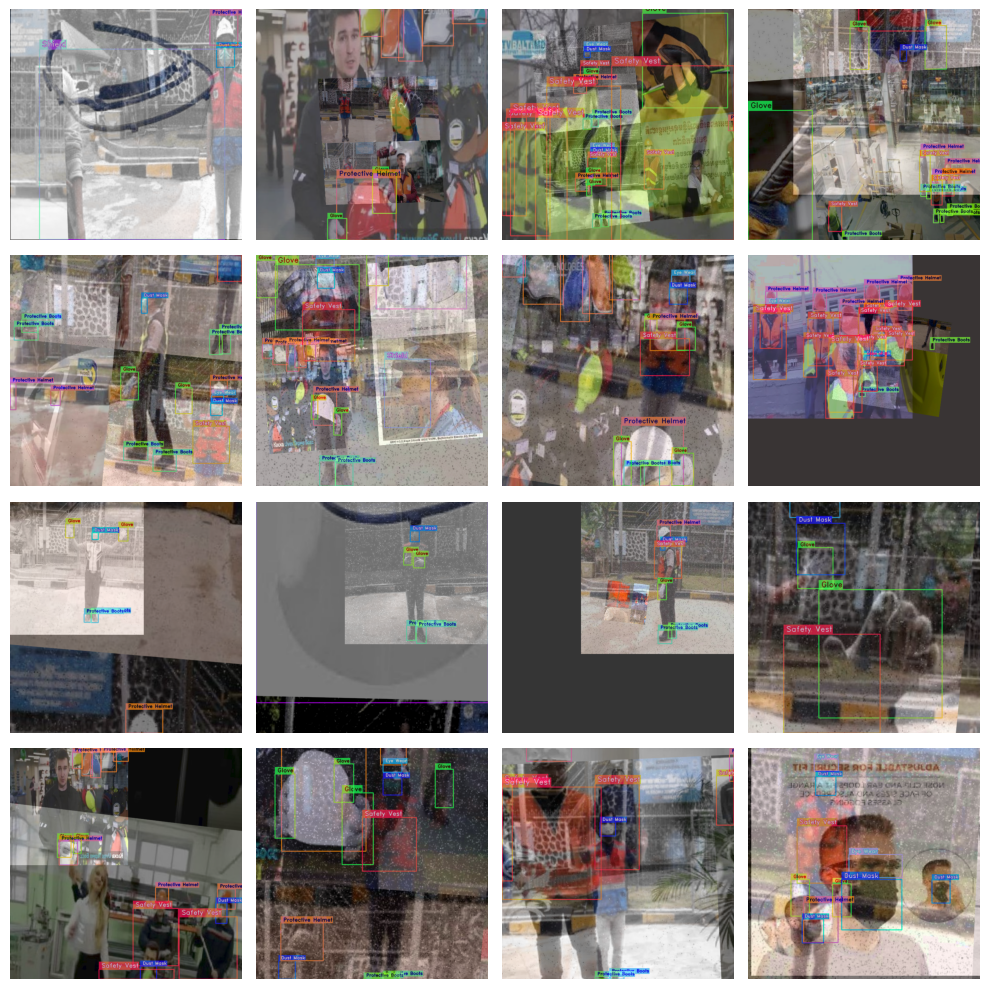

In [ ]:
train_data.dataset.plot()

 Instantiating the model

In [ ]:

model = models.get('yolo_nas_s',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2024-08-29 18:25:20] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-08-29 18:25:20] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:00<00:00, 92.3MB/s]
[2024-08-29 18:25:21] INFO - checkpo

Define metrics and training parameters

In [ ]:
train_params = {
    # ENABLING SILENT MODE
    'silent_mode': True,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 35,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}


Download the Demo Videos

In [ ]:

!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /content/PPE_Part1.mp4
100% 14.2M/14.2M [00:00<00:00, 73.2MB/s]


In [ ]:

!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /content/PPE_Part2.mp4
100% 11.1M/11.1M [00:00<00:00, 59.3MB/s]


Training the model

In [ ]:

trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

[2024-08-29 18:25:49] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240829_182549_788495`
[2024-08-29 18:25:49] INFO - sg_trainer.py - Checkpoints directory: checkpoints/ppe_yolonas_run/RUN_20240829_182549_788495
[2024-08-29 18:25:49] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


The console stream is now moved to checkpoints/ppe_yolonas_run/RUN_20240829_182549_788495/console_Aug29_18_25_49.txt


[2024-08-29 18:25:54] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            2271       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         141        (len(train_loader))
    - Gradient updates per epoch:   141        (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_S  (19.02M parameters, 19.02M optimized)
    - Learning Rates and Weight Decays:
      - default: (19.02M parameters). LR: 0.0005 (19.02M parameters) WD: 0.0, (42.15K parameters), WD: 0.0001, (18.98M parameters)

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch

Get the best trained model

In [ ]:
import gdown

url = "https://drive.google.com/uc?id=112V6OmlFU08omLhxgIFqOKRryNIa9otF&confirm=t"
output = "ckpt_best.pth"
gdown.download(url, output, quiet=False)


[2024-08-29 20:10:35] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process
`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
Downloading...
From: https://drive.google.com/uc?id=112V6OmlFU08omLhxgIFqOKRryNIa9otF&confirm=t
To: /content/ckpt_best.pth
 92%|█████████▏| 235M/256M [00:07<00:00, 39.7MB/s]

'ckpt_best.pth'

In [ ]:
import os
print(os.listdir('/content/'))


In [ ]:
checkpoint_path = "/content/ckpt_best.pth"
if os.path.exists(checkpoint_path):
    print("Checkpoint path is valid.")
else:
    print("Checkpoint path is invalid.")


In [ ]:

best_model = models.get('yolo_nas_s',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/ckpt_best.pth")

[2024-08-29 20:16:47] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/ckpt_best.pth EMA checkpoint.


Evaluating the best trained model on the test set

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))


Testing: 100%|██████████| 21/21 [00:15<00:00,  2.88it/s]

{'PPYoloELoss/loss_cls': 0.75780976,
 'PPYoloELoss/loss_iou': 0.4071094,
 'PPYoloELoss/loss_dfl': 0.43498367,
 'PPYoloELoss/loss': 1.5999027,
 'Precision@0.50': 0.06599166244268417,
 'Recall@0.50': 0.9760837554931641,
 'mAP@0.50': 0.8076192140579224,
 'F1@0.50': 0.12078861147165298,
 'Best_score_threshold': 0.4599999785423279}

Testing: 100%|██████████| 21/21 [00:15<00:00,  1.32it/s]


In [ ]:
import os
print(os.path.isfile('/content/PPE_Detection-2/valid/images/46_jpg.rf.853a028da17ab1720e3e7bcfdbba9223.jpg'))


True


In [ ]:
import os

file_path = '/content/PPE_Detection-2/valid/images/46_jpg.rf.853a028da17ab1720e3e7bcfdbba9223.jpg'
if os.path.exists(file_path):
    print("File exists.")
else:
    print("File not found.")


File exists.


In [ ]:
import os

file_path = '/content/PPE_Detection-2/valid/images/46_jpg.rf.853a028da17ab1720e3e7bcfdbba9223.jpg'
print(os.path.exists(file_path))  # Should print True if the file exists


True


In [ ]:
test_image_path = '/content/PPE_Detection-2/valid/images/46_jpg.rf.853a028da17ab1720e3e7bcfdbba9223.jpg'  # Use a known valid image path
try:
    img = Image.open(test_image_path)
    img.show()
except Exception as e:
    print(f"Error opening test image: {e}")


Error opening test image: name 'Image' is not defined


In [ ]:
import os

file_path = '/content/PPE_Detection-2/valid/images/46_jpg.rf.853a028da17ab1720e3e7bcfdbba9223.jpg'
file_size = os.path.getsize(file_path)
print(f"File size: {file_size} bytes")


File size: 50683 bytes


In [ ]:
import os

# List files in the directory to verify
image_dir = '/content/PPE_Detection-2/valid/images/'
files = os.listdir(image_dir)
print("Files in directory:", files)


Files in directory: ['image_133_jpg.rf.063e325a34d3cdc475014b98c2d2b260.jpg', 'sird1584_jpg.rf.84754f2ff1c91ad8a3cdcb1eb0c49b5c.jpg', 'image_103_jpg.rf.5e77c8d3e7cfcc667a2ddcc0cdeb30d8.jpg', 'Aitin0474_jpg.rf.37d362afb4606af5276030762754f453.jpg', 'image_249_jpg.rf.3ecfa3f05d4a69e2820fafc92e828369.jpg', 'image_151_jpg.rf.f8ce97998e3ff1a259552568d9b2f7f2.jpg', 'image_215_jpg.rf.f5bdaf8a4223dae40f6ba2f6f7261e1f.jpg', 'image_37_jpg.rf.3fdea43e0196a477d240d29aa703052e.jpg', 'Tan0341341_jpg.rf.9fd2f7e77b504def47c0e89825a2342d.jpg', 'image_90_jpg.rf.6680bd2c0485e9144fc4971ac10ce3f0.jpg', 'image_37_jpg.rf.ab798882e5a9cb2a5c7ba8a0b1f3fefa.jpg', 'sird1482_jpg.rf.520597c922bba0e0a6a5089a0731d621.jpg', 'Twalv1202_jpg.rf.c9ad278211feba6649aed3f285b4f4b4.jpg', 'image_103_jpg.rf.698f34c222267031fc0465877abd1553.jpg', 'Aitin2898_jpg.rf.4168197e9b1211af7e710584fa15db3d.jpg', 'Photin1072_jpg.rf.16b11440fca7667d38c7910a9ff3d9b6.jpg', 'image_51_jpg.rf.79d2f35c3f6a41b8c57eea76e5cb70f1.jpg', 'phifs18616_jp

In [ ]:
import cv2

# Define the file path
file_path = '/content/PPE_Detection-2/valid/images/57_jpg.rf.114bec2823ecf2b116d5427de3a5b869.jpg'

# Read the image
img = cv2.imread(file_path)

if img is None:
    print("Failed to load image with OpenCV.")
else:
    print("Image loaded successfully with OpenCV.")


Image loaded successfully with OpenCV.


In [ ]:
import mimetypes

# Guess MIME type
mime_type, _ = mimetypes.guess_type(file_path)
print(f"Detected MIME type: {mime_type}")


Detected MIME type: image/jpeg


In [ ]:
from PIL import Image

try:
    img = Image.open(file_path)
    img.verify()  # Verify image integrity
    print("Image is valid and intact.")
except Exception as e:
    print(f"Error verifying image: {e}")


Error verifying image: cannot identify image file '/content/PPE_Detection-2/valid/images/57_jpg.rf.114bec2823ecf2b116d5427de3a5b869.jpg'


In [ ]:
import os

file_path = '/content/PPE_Detection-2/valid/images/57_jpg.rf.114bec2823ecf2b116d5427de3a5b869.jpg'
if os.path.isfile(file_path):
    file_size = os.path.getsize(file_path)
    print(f"File exists. Size: {file_size} bytes")
else:
    print("File does not exist.")


File exists. Size: 41361 bytes


In [ ]:
with open(file_path, 'rb') as f:
    head = f.read(20)  # Read the first 20 bytes
    print("File header:", head)


File header: b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00'


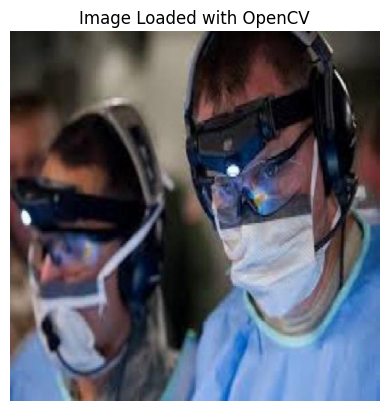

In [ ]:
import cv2
from matplotlib import pyplot as plt

img = cv2.imread(file_path)
if img is None:
    print("Failed to load image with OpenCV.")
else:
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Image Loaded with OpenCV')
    plt.axis('off')
    plt.show()


Predicting with the best model

Error loading or verifying image with PIL: cannot identify image file '/content/PPE_Detection-2/valid/images/thumb2435_jpg.rf.ddbc40f37af0c012dc702b12eb7feb52.jpg'


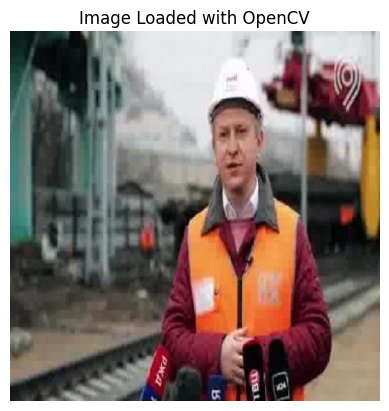

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import cv2

# Define the image path
img_url = '/content/PPE_Detection-2/valid/images/thumb2435_jpg.rf.ddbc40f37af0c012dc702b12eb7feb52.jpg'

# Step 1: Verify the image file
try:
    img = Image.open(img_url)
    img.verify()  # Verify that it is a valid image
    print("Image loaded and verified successfully.")
    img = Image.open(img_url)  # Re-open image for actual use
except Exception as e:
    print(f"Error loading or verifying image with PIL: {e}")
    img = None

# Step 2: If PIL fails, try using OpenCV
if img is None:
    try:
        img = cv2.imread(img_url)
        if img is not None:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title('Image Loaded with OpenCV')
            plt.axis('off')
            plt.show()
            print("Image loaded successfully with OpenCV.")
        else:
            print("OpenCV failed to load the image.")
    except Exception as e:
        print(f"Error loading image with OpenCV: {e}")

# Step 3: Proceed with model prediction if image was successfully loaded
if img is not None:
    try:
        results = best_model.predict(img_url)  # Predict using image path
        # Or, if OpenCV loaded the image, convert back to PIL Image if needed
        # results = best_model.predict(Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)))

        # Display results if available
        results.show()
    except Exception as e:
        print(f"Error during prediction: {e}")


Image successfully loaded with OpenCV.


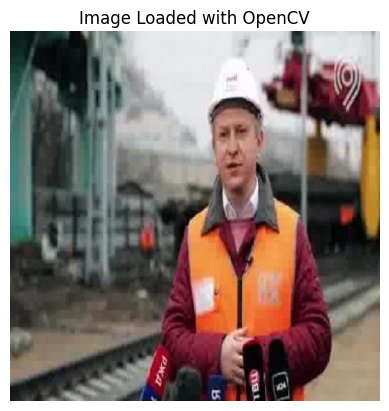

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
[2024-08-29 20:18:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


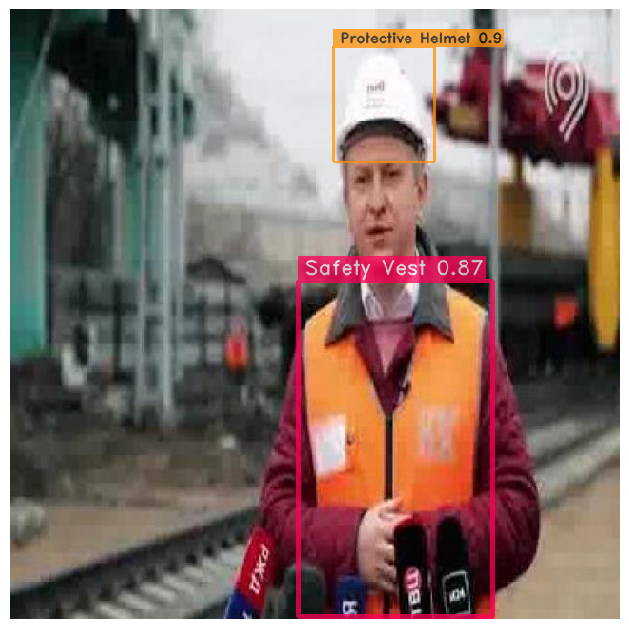

In [ ]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Define the image path
img_url = '/content/PPE_Detection-2/valid/images/thumb2435_jpg.rf.ddbc40f37af0c012dc702b12eb7feb52.jpg'

# Step 1: Attempt to load the image using OpenCV
img = cv2.imread(img_url)

if img is not None:
    print("Image successfully loaded with OpenCV.")

    # Display the image using OpenCV to verify
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Image Loaded with OpenCV')
    plt.axis('off')
    plt.show()

    # Step 2: Convert the image to PIL format if necessary for model input
    img_pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Step 3: Attempt to use the model for prediction
    try:
        results = best_model.predict(img_pil)
        results.show()
    except Exception as e:
        print(f"Error during prediction: {e}")
else:
    print("OpenCV failed to load the image. The file may be corrupted or not an image.")


In [ ]:
import torch

# Load the entire model
model = torch.load('/content/gdrive/MyDrive/Techathon/custom_yolonas_model_full3.pth')

# Set model to evaluation mode if using for inference
model.eval()

<ipython-input-7-773ca668564d>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('/content/gdrive/MyDrive/Techathon/custom_yolonas_model_full3.pth')


YoloNAS_S(
  (backbone): NStageBackbone(
    (stem): YoloNASStem(
      (conv): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        )
        (branch_1x1): Conv2d(3, 48, kernel_size=(1, 1), stride=(2, 2))
        (post_bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (rbr_reparam): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
    )
    (stage1): YoloNASStage(
      (downsample): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(48, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=Tr

Testing on Video 2

In [ ]:
# set input and output paths
input_video_path = f"/content/PPE_Part2.mp4"
output_video_path = "detections1.mp4"

In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [ ]:
# use the model for prediction
model.to(device).predict(input_video_path).save(output_video_path)

Processing Video:   0%|          | 0/267 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/super_gradients/training/pipelines/pipelines.py:210: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with eval_mode(self.model), torch.no_grad(), torch.cuda.amp.autocast(enabled=self.fp16):
[2024-08-29 21:21:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
Processing Video:  98%|█████████▊| 262/267 [00:20<00:00, 20.48it/s]

In [ ]:
# Re-encode the video using ffmpeg to ensure it's in a compatible forma
!ffmpeg -i /content/detections1.mp4 -vcodec libx264 -acodec aac /content/detections_converted.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

Display the Output Video

In [ ]:
# display the video
from IPython.display import Video
Video('/content/detections_converted.mp4', embed=True, width=640, height=480)

In [ ]:
import torch

# Save the entire model
torch.save(best_model, '/content/custom_yolonas_model_full3.pth')

In [ ]:
import torch

# Load the entire model
model = torch.load('custom_yolonas_model_full3.pth')

# Set model to evaluation mode if using for inference
model.eval()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


YoloNAS_S(
  (backbone): NStageBackbone(
    (stem): YoloNASStem(
      (conv): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        )
        (branch_1x1): Conv2d(3, 48, kernel_size=(1, 1), stride=(2, 2))
        (post_bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (rbr_reparam): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
    )
    (stage1): YoloNASStage(
      (downsample): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(48, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=Tr

In [ ]:
import os

os.environ['LC_ALL'] = 'C.UTF-8'
os.environ['LANG'] = 'C.UTF-8'


In [ ]:
import shutil

source = '/content/custom_yolonas_model_full3.pth'
destination = '/content/gdrive/MyDrive/Techathon/'

shutil.move(source, destination)


'/content/gdrive/MyDrive/Techathon/custom_yolonas_model_full3.pth'

In [ ]:
torch.__version__

'2.4.0+cu121'